# Feature vs Label Distribution

One plot per feature against the target label (`score`).
- Continuous features: scatter plot with regression line
- Categorical features: box plot

In [1]:
# Parameters cell (papermill injects values here)
data_path = "data/features.csv"

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from pathlib import Path

plt.style.use("seaborn-v0_8-whitegrid")
sns.set_palette("muted")

PLOT_DIR = Path("data/plots/features")
PLOT_DIR.mkdir(parents=True, exist_ok=True)

In [3]:
df = pd.read_csv(data_path)
print(f"Dataset shape: {df.shape}")
df.head()

Dataset shape: (17870, 52)


,image_path,dataset,gender,ethnicity,score_raw,split,annotator_std,outlier_flag,canthal_tilt,eye_width_ratio,...,expr_smile,expr_frown,expr_jaw_open,expr_brow_up,expr_brow_down,expr_cheek_squint,expr_eye_squint,expr_eye_wide,expr_mouth_pucker,score
0,datasets/MEBeauty-database-main/cropped_images...,mebeauty,female,indian,3.790123,train,2.251983,low_variance,8.671438,0.193610,...,0.027310,0.018052,0.013686,0.007092,0.292012,7.795466e-07,0.614818,0.006509,0.001070,-1.772144
1,datasets/MEBeauty-database-main/cropped_images...,mebeauty,female,caucasian,7.663194,train,1.290994,low_variance,8.301449,0.199253,...,0.020962,0.000015,0.004146,0.275103,0.005666,2.363481e-07,0.335253,0.010700,0.002949,1.135622
2,datasets/MEBeauty-database-main/cropped_images...,mebeauty,female,caucasian,4.561957,train,1.349137,low_variance,6.495868,0.216260,...,0.193299,0.000134,0.004383,0.301804,0.002331,8.100222e-07,0.359270,0.009136,0.012499,-1.192678
3,datasets/MEBeauty-database-main/cropped_images...,mebeauty,female,caucasian,5.960920,train,2.202392,low_variance,5.242400,0.196959,...,0.234368,0.000490,0.000779,0.053577,0.030170,5.991366e-07,0.371681,0.007947,0.033017,-0.142386
4,datasets/MEBeauty-database-main/cropped_images...,mebeauty,male,caucasian,5.046717,train,2.058125,low_variance,2.897247,0.170290,...,0.928434,0.000692,0.156579,0.005292,0.338675,2.148931e-06,0.660531,0.008272,0.000897,-0.828737


In [4]:
LABEL = "score"

GEOMETRY_FEATURES = [
    "canthal_tilt", "eye_width_ratio", "eye_height_ratio", "eyebrow_eye_dist",
    "eye_spacing_ratio", "eye_area_ratio", "scleral_show", "eye_asymmetry",
    "brow_arch_height", "nose_width_ratio", "nose_length_ratio", "nose_symmetry",
    "lip_width_ratio", "upper_lip_ratio", "lip_fullness_ratio",
    "mouth_width_face_ratio", "cupids_bow_ratio", "mouth_chin_ratio",
    "mouth_symmetry", "facial_symmetry", "face_length_width_ratio",
    "jaw_width_ratio", "interpupillary_ratio", "gonial_angle", "chin_taper",
    "eye_symmetry", "midface_ratio", "lower_face_ratio", "phi_deviation",
    "facial_thirds_symmetry",
]

EXPRESSION_FEATURES = [
    "expr_smile", "expr_frown", "expr_jaw_open", "expr_brow_up",
    "expr_brow_down", "expr_cheek_squint", "expr_eye_squint",
    "expr_eye_wide", "expr_mouth_pucker",
]

OTHER_CONTINUOUS = ["head_roll"]

CATEGORICAL_FEATURES = ["gender", "ethnicity", "dataset"]

CONTINUOUS_FEATURES = GEOMETRY_FEATURES + EXPRESSION_FEATURES + OTHER_CONTINUOUS

# Filter to columns that actually exist in the dataframe
CONTINUOUS_FEATURES = [f for f in CONTINUOUS_FEATURES if f in df.columns]
CATEGORICAL_FEATURES = [f for f in CATEGORICAL_FEATURES if f in df.columns]

print(f"Continuous features: {len(CONTINUOUS_FEATURES)}")
print(f"Categorical features: {len(CATEGORICAL_FEATURES)}")

Continuous features: 40
Categorical features: 3


## Continuous Features vs Score

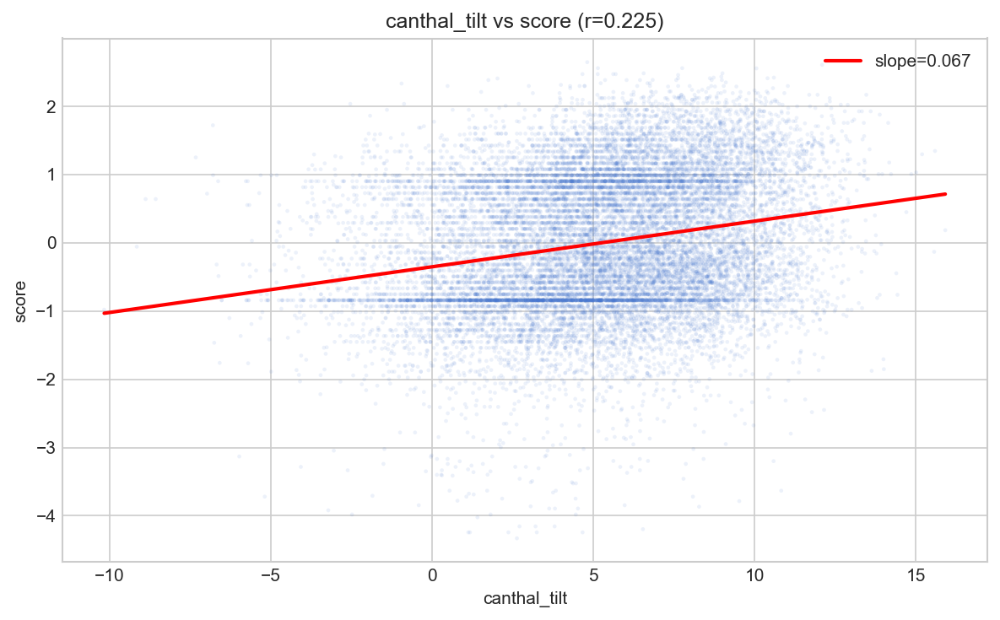

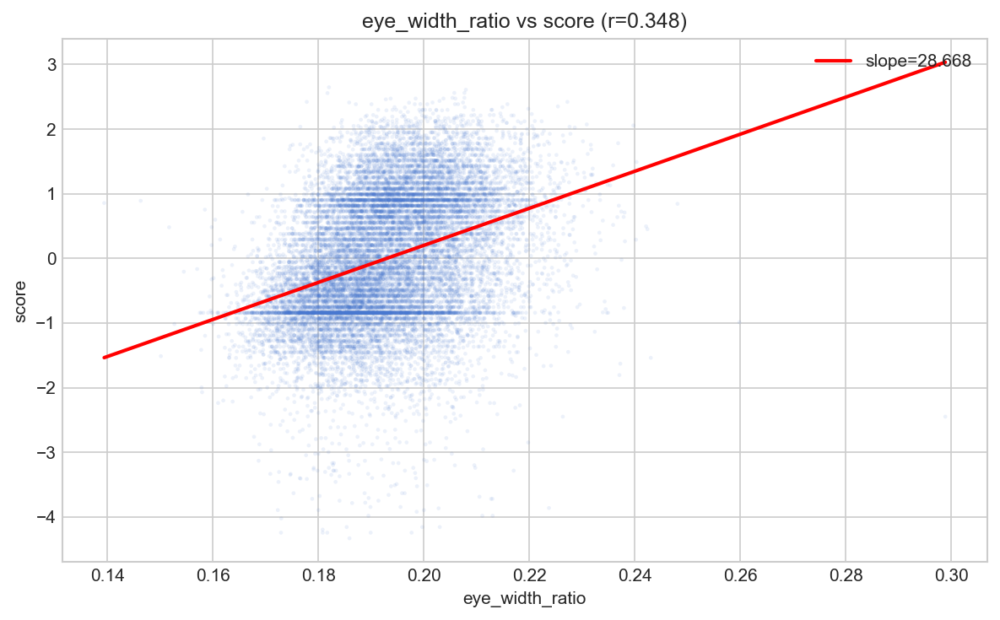

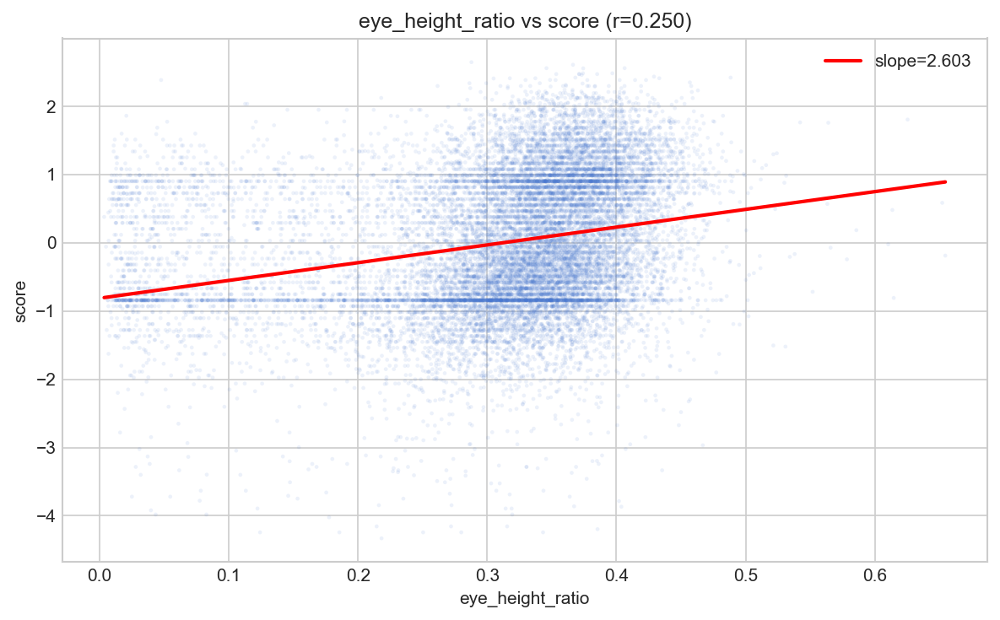

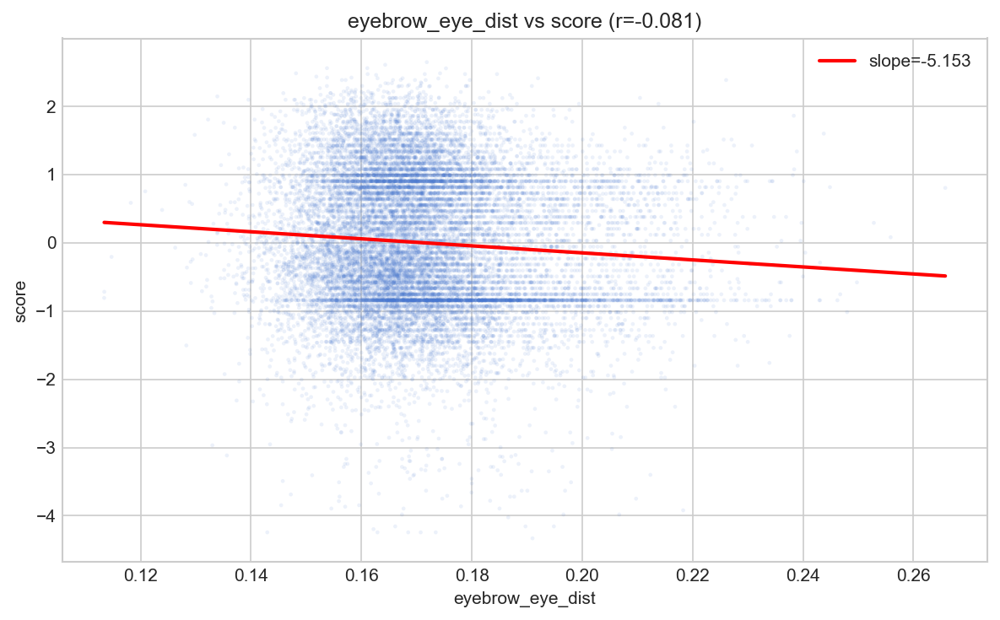

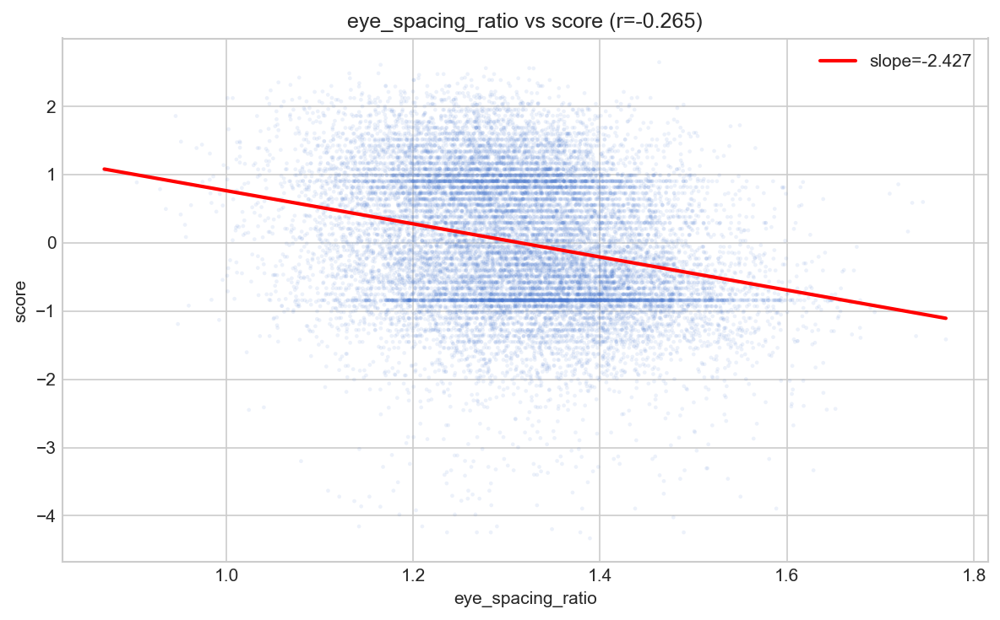

...

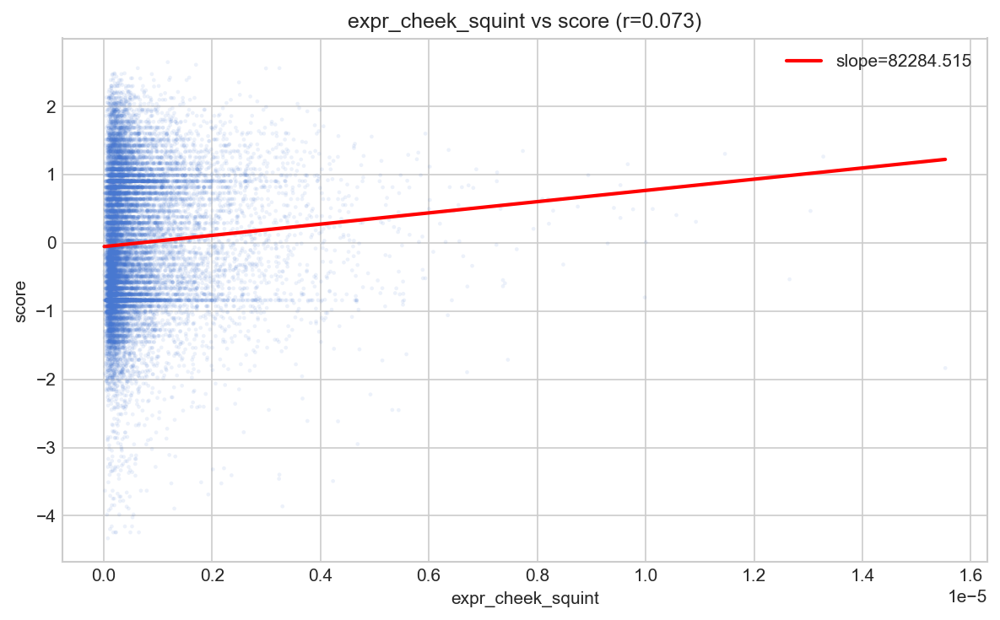

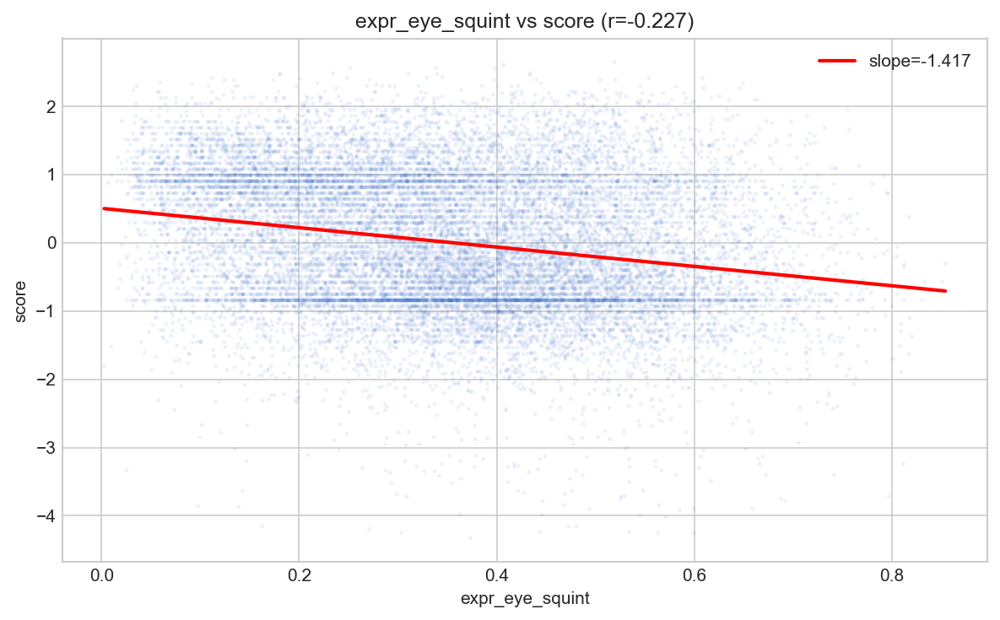

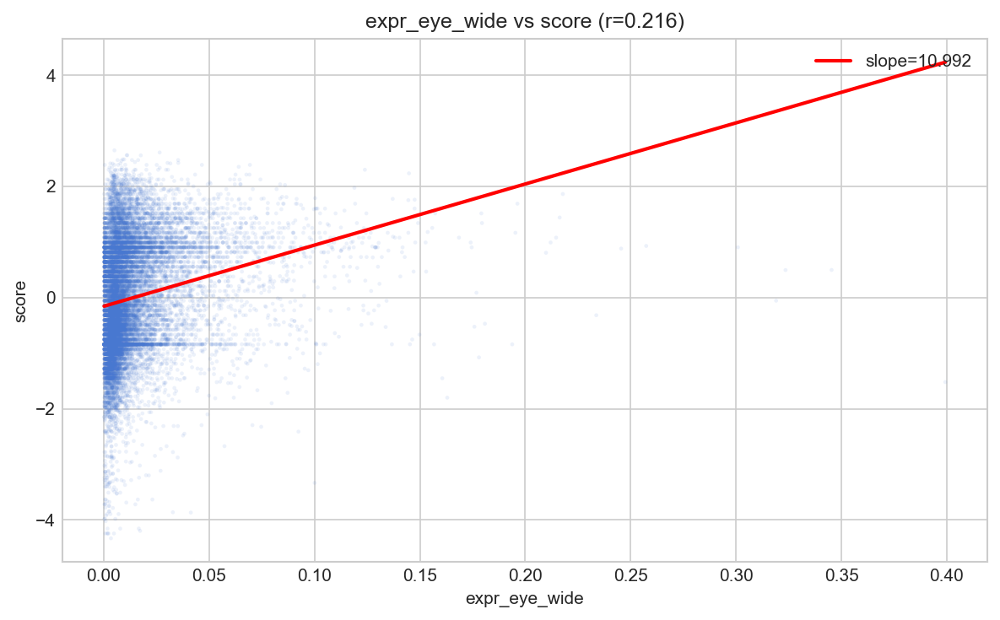

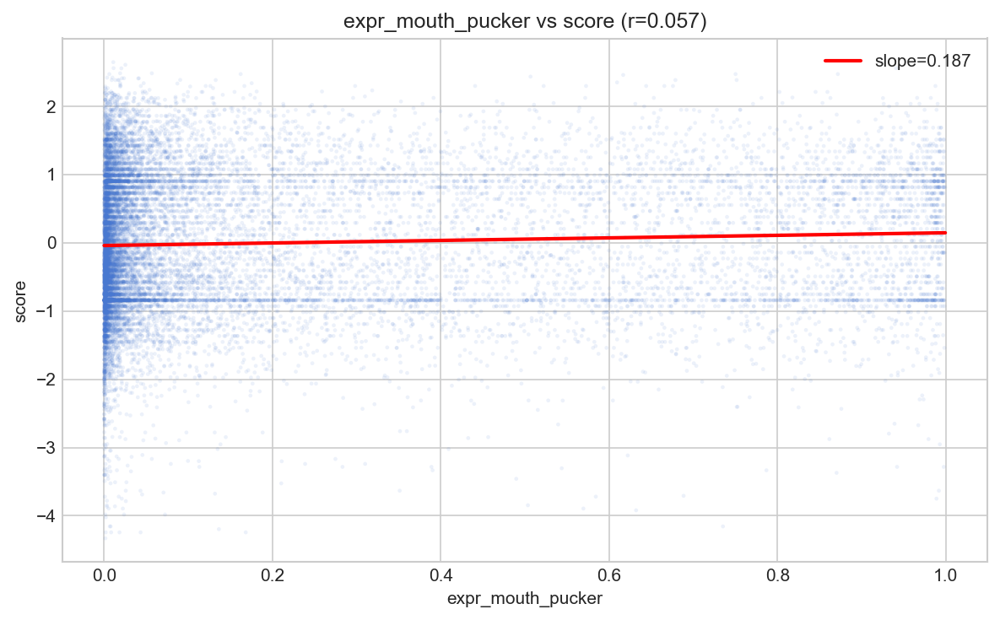

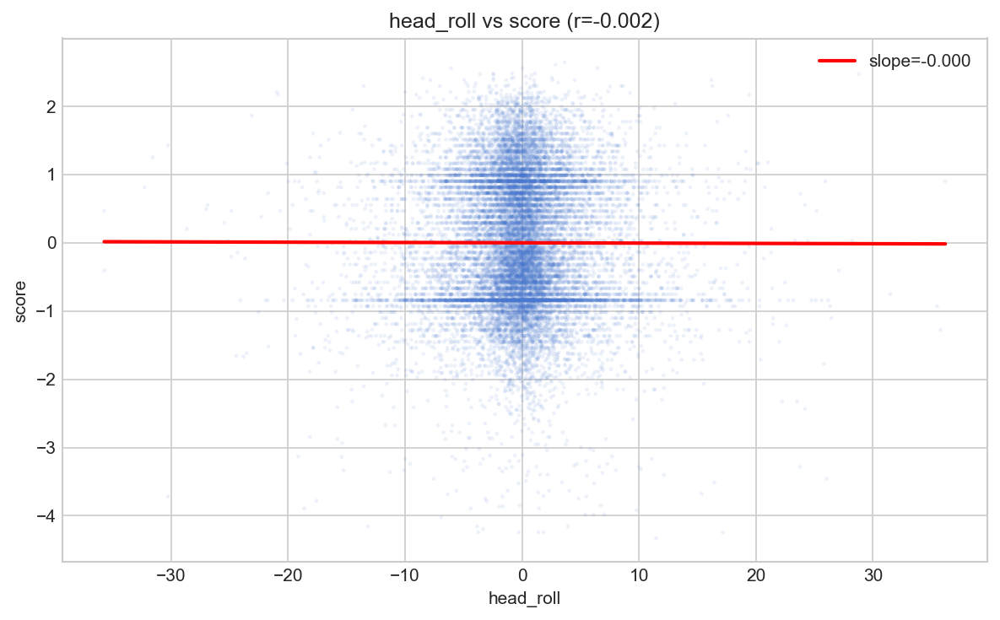

In [5]:
for feature in CONTINUOUS_FEATURES:
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.scatter(df[feature], df[LABEL], alpha=0.1, s=5, edgecolors="none")

    # Regression line using scipy linregress (numerically stable OLS)
    mask = df[feature].notna() & df[LABEL].notna()
    if mask.sum() > 2:
        result = stats.linregress(df.loc[mask, feature], df.loc[mask, LABEL])
        x_range = np.linspace(df[feature].min(), df[feature].max(), 100)
        ax.plot(x_range, result.slope * x_range + result.intercept, "r-",
                linewidth=2, label=f"slope={result.slope:.3f}")
        ax.set_title(f"{feature} vs {LABEL} (r={result.rvalue:.3f})")
    else:
        ax.set_title(f"{feature} vs {LABEL}")

    ax.set_xlabel(feature)
    ax.set_ylabel(LABEL)
    ax.legend(loc="upper right")
    plt.tight_layout()
    plt.savefig(PLOT_DIR / f"{feature}.png", dpi=150, bbox_inches="tight")
    plt.show()
    plt.close(fig)

## Categorical Features vs Score

/Users/I568850/repositories/uni/data-mining/code/.venv/lib/python3.14/site-packages/seaborn/_base.py:1447: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  self.plot_data[axis] = cat_data
/Users/I568850/repositories/uni/data-mining/code/.venv/l

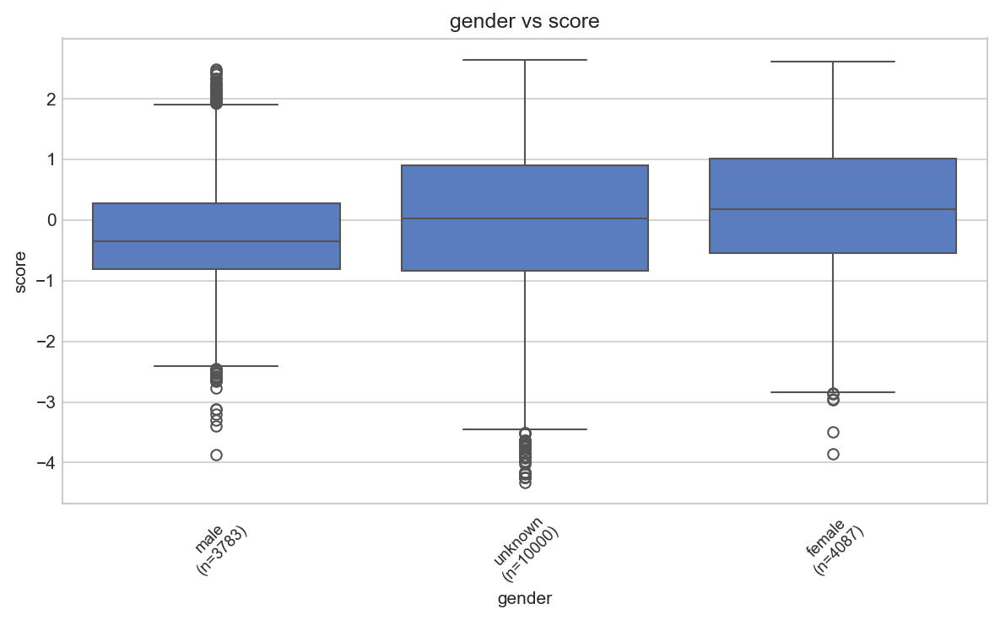

/Users/I568850/repositories/uni/data-mining/code/.venv/lib/python3.14/site-packages/seaborn/_base.py:1447: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  self.plot_data[axis] = cat_data
/Users/I568850/repositories/uni/data-mining/code/.venv/l

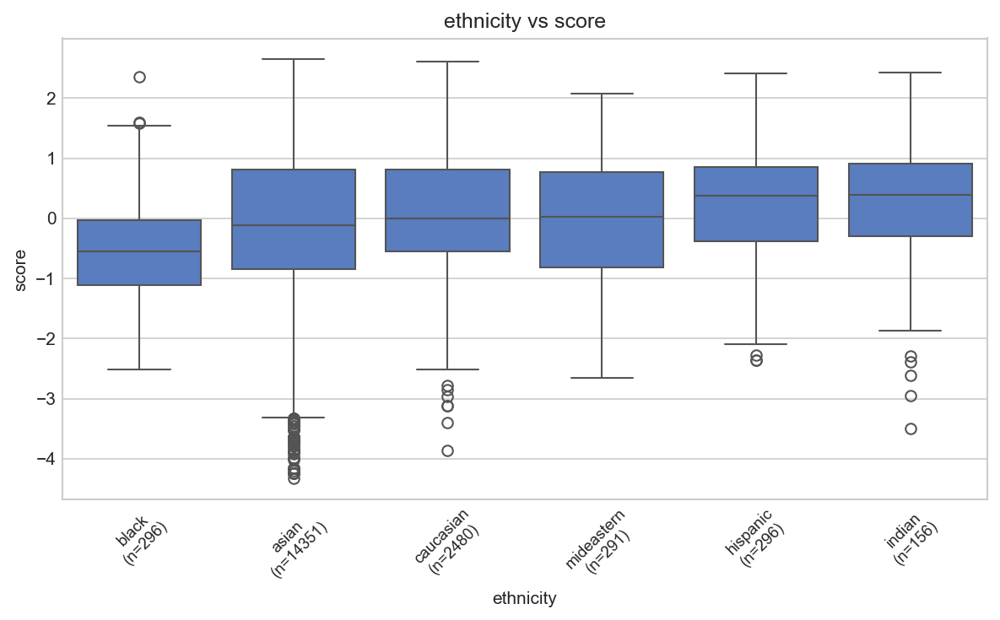

/Users/I568850/repositories/uni/data-mining/code/.venv/lib/python3.14/site-packages/seaborn/_base.py:1447: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  self.plot_data[axis] = cat_data
/Users/I568850/repositories/uni/data-mining/code/.venv/l

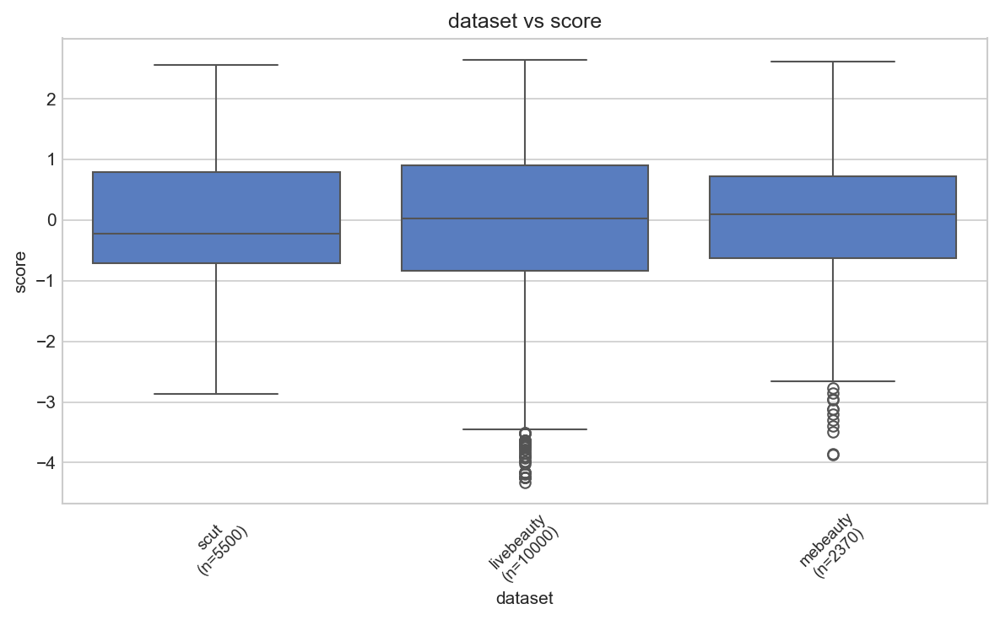

In [6]:
for feature in CATEGORICAL_FEATURES:
    fig, ax = plt.subplots(figsize=(8, 5))
    order = df.groupby(feature)[LABEL].median().sort_values().index
    sns.boxplot(data=df, x=feature, y=LABEL, ax=ax, order=order)
    ax.set_title(f"{feature} vs {LABEL}")
    ax.set_xlabel(feature)
    ax.set_ylabel(LABEL)
    ax.tick_params(axis="x", rotation=45)

    # Add sample counts
    counts = df[feature].value_counts()
    labels = [f"{cat}\n(n={counts[cat]})" for cat in order]
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, fontsize=9)

    plt.tight_layout()
    plt.savefig(PLOT_DIR / f"{feature}.png", dpi=150, bbox_inches="tight")
    plt.show()
    plt.close(fig)

## Correlation Summary

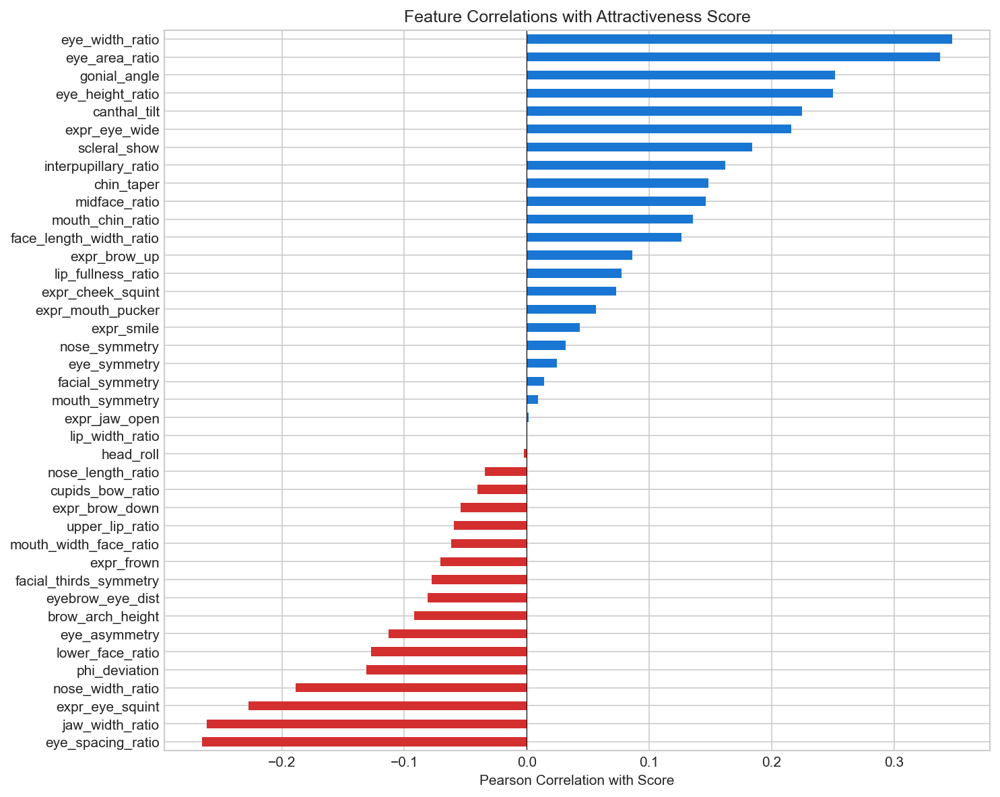


Top 10 positive correlations:
midface_ratio           0.146035
chin_taper              0.148281
interpupillary_ratio    0.162244
scleral_show            0.184123
expr_eye_wide           0.216046
canthal_tilt            0.225093
eye_height_ratio        0.250313
gonial_angle            0.251631
eye_area_ratio          0.337557
eye_width_ratio         0.347660

Top 10 negative correlations:
eye_spacing_ratio        -0.265269
jaw_width_ratio          -0.261604
expr_eye_squint          -0.227083
nose_width_ratio         -0.189068
phi_deviation            -0.131275
lower_face_ratio         -0.127089
eye_asymmetry            -0.112983
brow_arch_height         -0.092260
eyebrow_eye_dist         -0.081048
facial_thirds_symmetry   -0.077524


In [7]:
correlations = df[CONTINUOUS_FEATURES + [LABEL]].corr()[LABEL].drop(LABEL).sort_values()

fig, ax = plt.subplots(figsize=(10, 8))
colors = ["#d32f2f" if v < 0 else "#1976d2" for v in correlations.values]
correlations.plot(kind="barh", ax=ax, color=colors)
ax.set_xlabel("Pearson Correlation with Score")
ax.set_title("Feature Correlations with Attractiveness Score")
ax.axvline(x=0, color="black", linewidth=0.5)
plt.tight_layout()
plt.savefig(PLOT_DIR / "_correlation_summary.png", dpi=150, bbox_inches="tight")
plt.show()
plt.close(fig)

print("\nTop 10 positive correlations:")
print(correlations.tail(10).to_string())
print("\nTop 10 negative correlations:")
print(correlations.head(10).to_string())